In [39]:
import json
import os
import sys

import open3d as o3d

os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"

module_path = os.path.abspath(os.path.join(".."))
if module_path not in sys.path:
    sys.path.append(module_path)

o3d._build_config["ENABLE_HEADLESS_RENDERING"]

True

In [40]:
import numpy as np
import open3d as o3d
import torch
import matplotlib.pyplot as plt
from PIL import Image

from core.integrate import FeatureFusionScalableTSDFVolume

In [41]:
data_dir = '/home/quanta/Experiments/feature-instance-fusion/'
scenes = [ name for name in os.listdir(data_dir) if name [:7] == 'scannet']

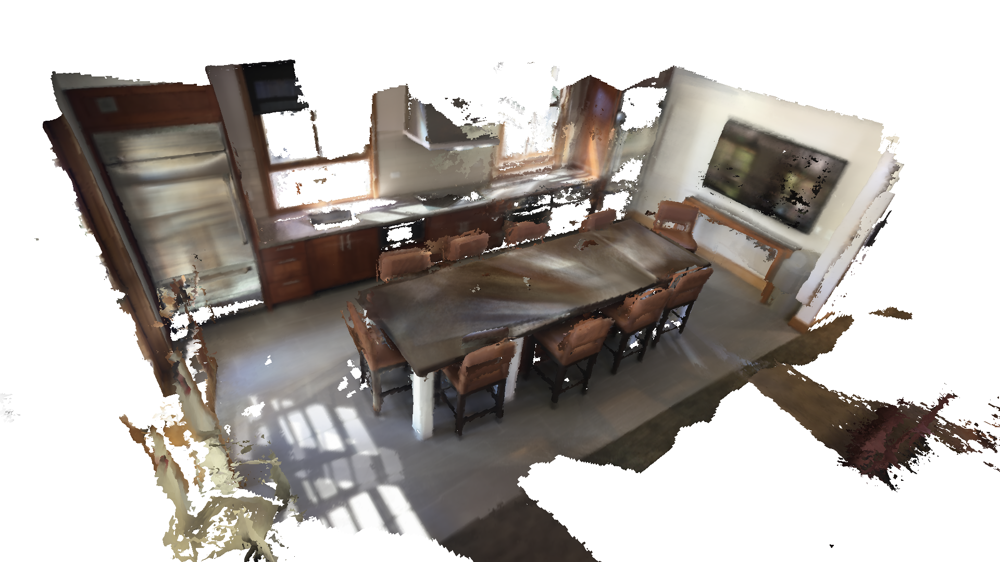

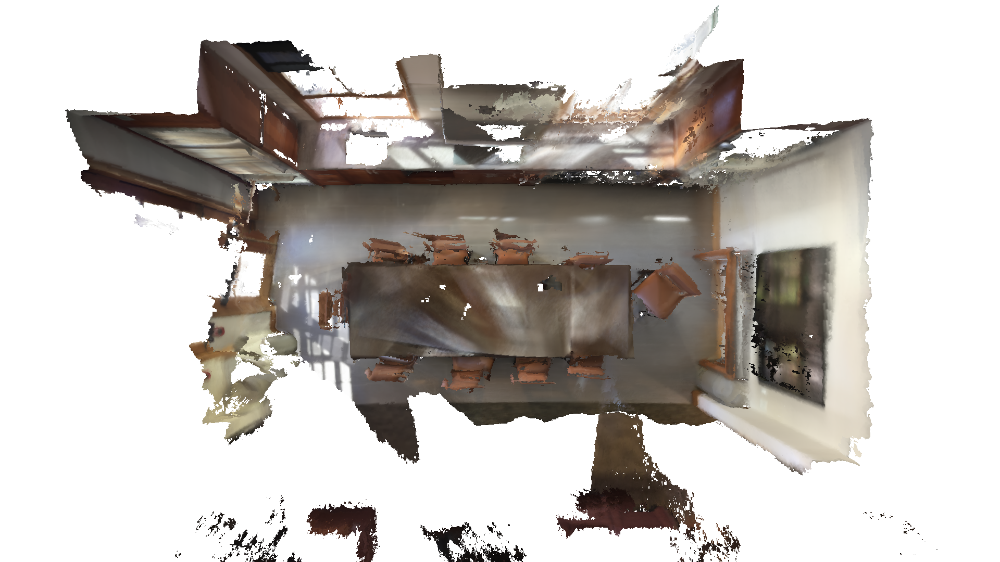

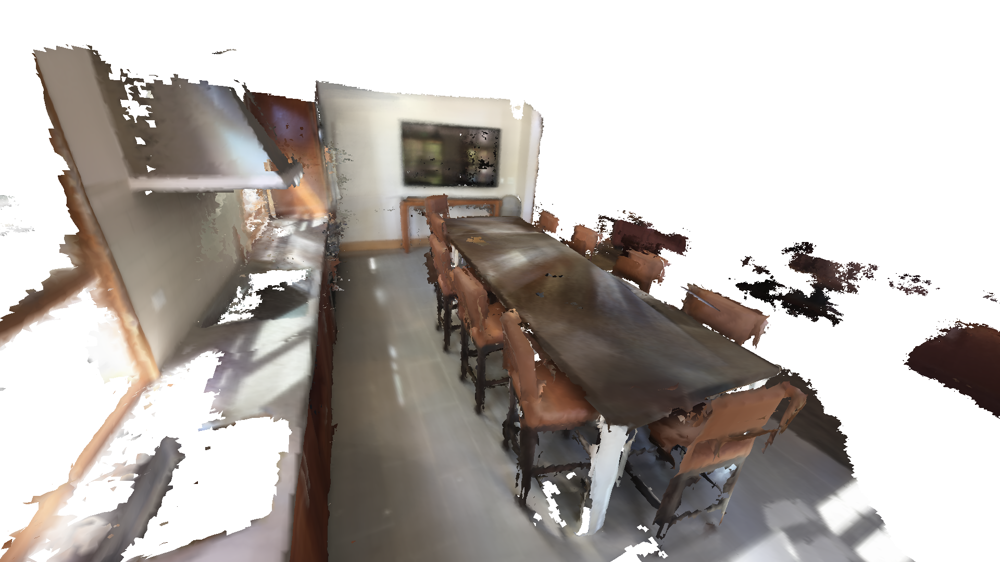

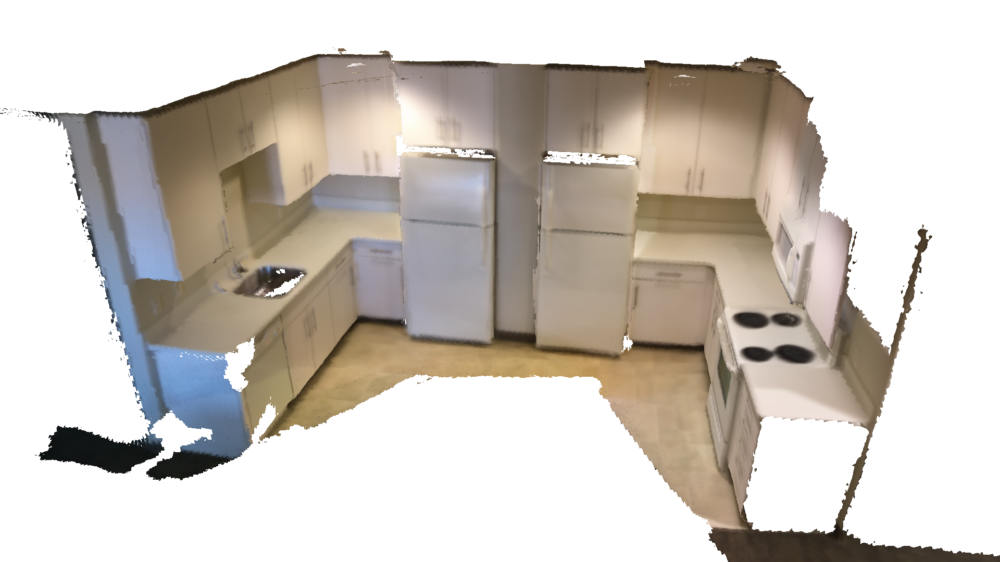

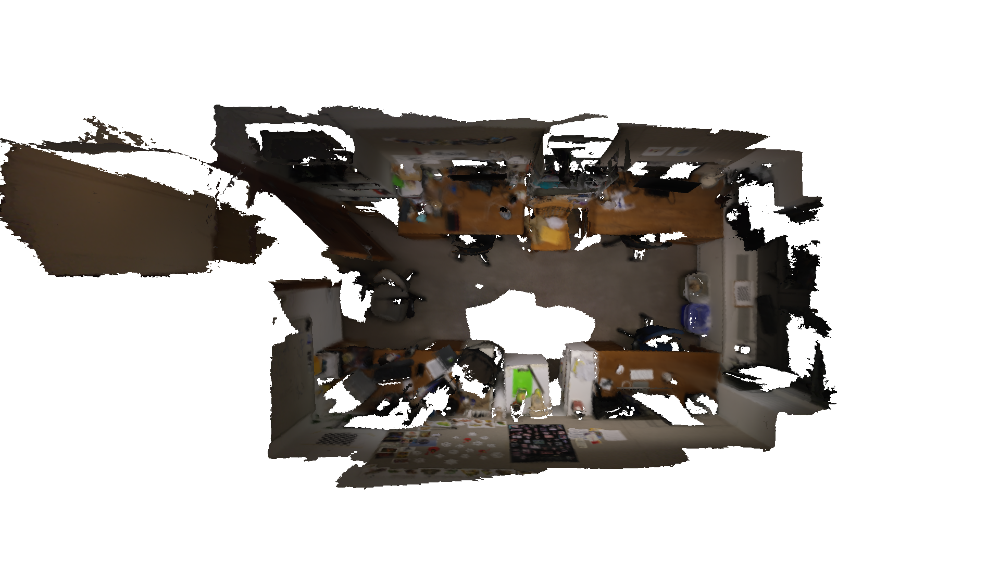

...

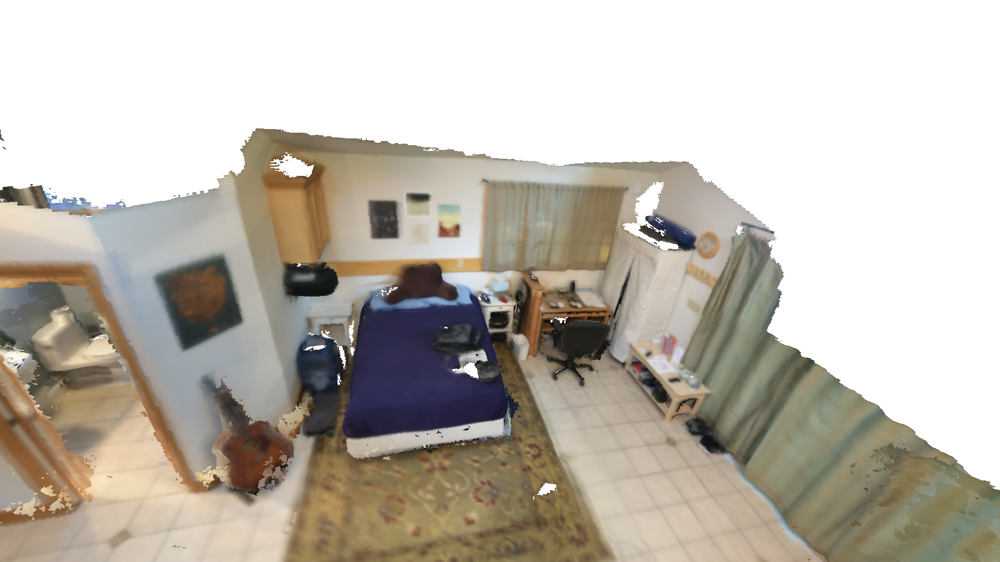

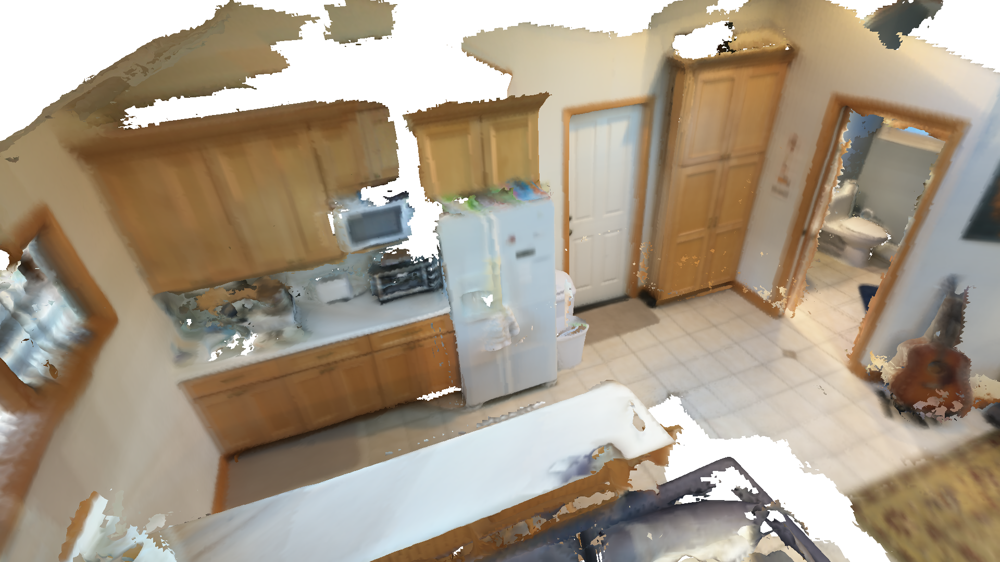

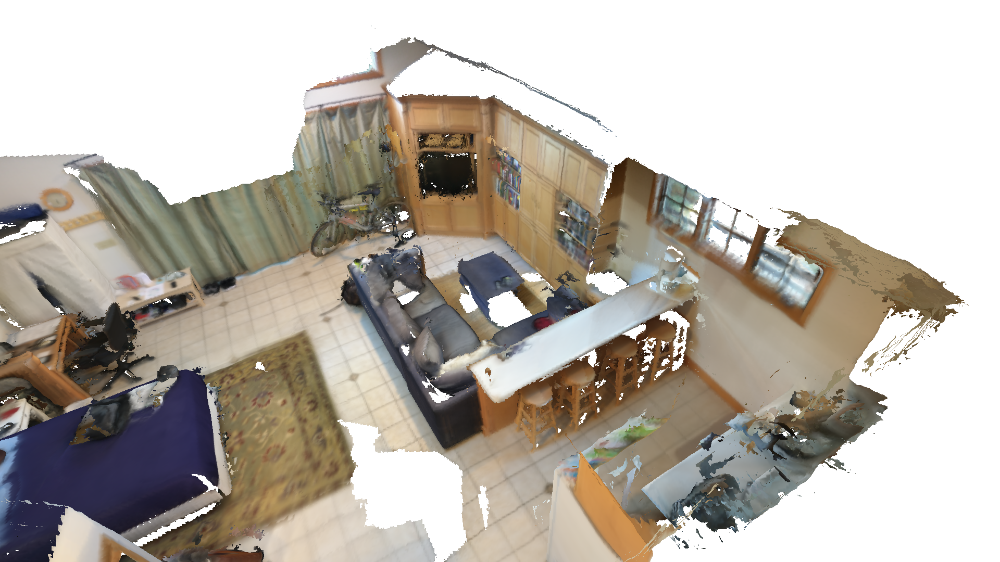

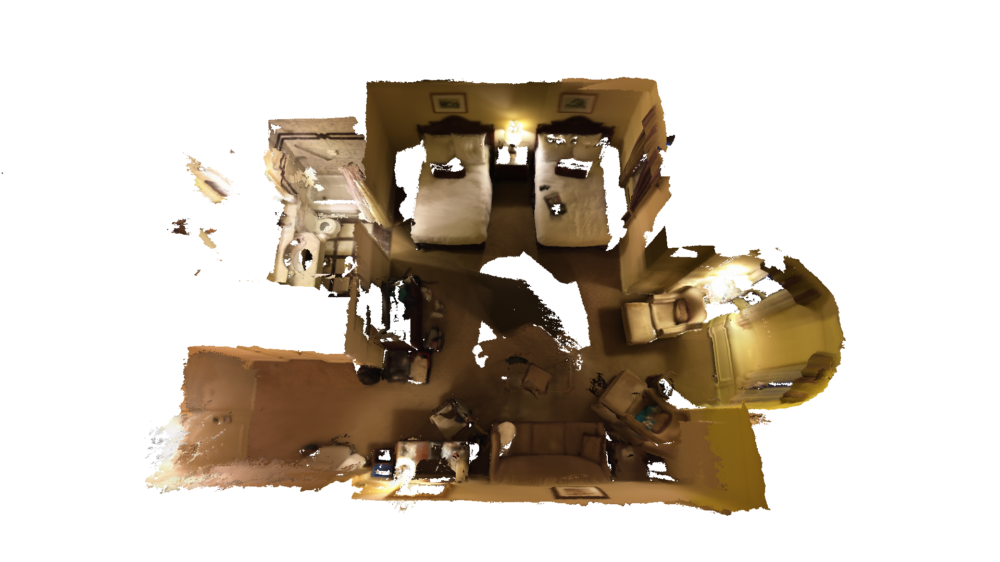

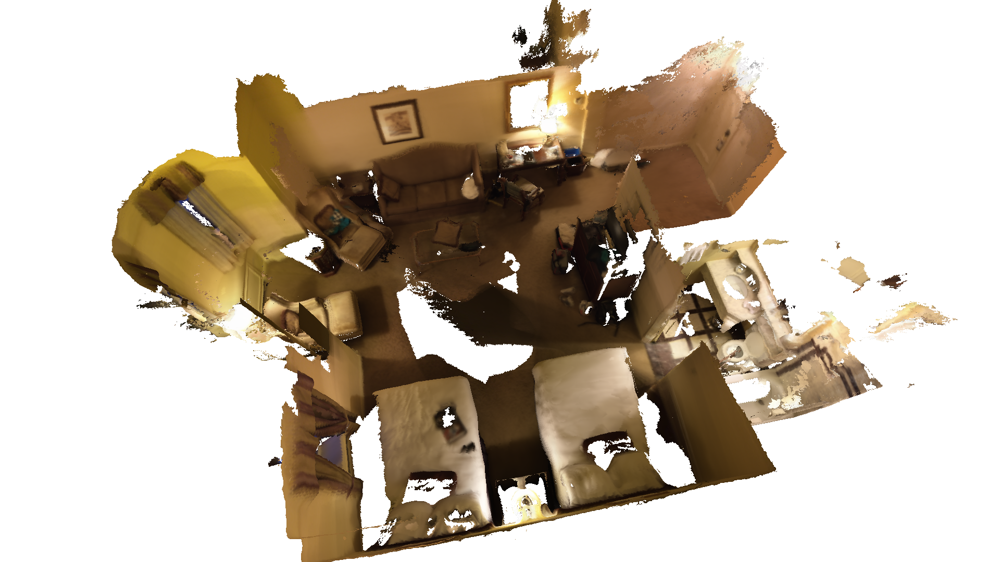

In [50]:
for scene in scenes:
    json_pth = os.path.abspath("../config/views/" + scene + ".json")
    # print(json_pth)
    with open(json_pth, "r") as f:
        views = json.load(f)

    tsdf_device = "cuda:1"
    tsdf_volume = FeatureFusionScalableTSDFVolume(
        voxel_size=0.015,
        sdf_trunc=0.075,
        margin=0.08,
        device="cuda:1",
    )

    save_dir = data_dir + scene + "/"
    tsdf_volume.load(save_dir + "tsdf/tsdf_volume.pt")
    verts = np.load(save_dir + "tsdf/verts.npy")
    faces = np.load(save_dir + "tsdf/faces.npy")
    tsdf_volume.reset_feature(dim=3, include_var=False, dtype=float)
    tsdf_volume.load_feats(save_dir + "tsdf_feature_color/feats.pt")
    color = tsdf_volume.extract_feat_on_grid(verts=verts)[0]

    mesh = o3d.geometry.TriangleMesh(
        vertices=o3d.utility.Vector3dVector(verts),
        triangles=o3d.utility.Vector3iVector(faces),
    )
    mesh.vertex_colors = o3d.utility.Vector3dVector(color)

    vis = o3d.visualization.Visualizer()
    vis.create_window()
    vis.add_geometry(mesh)

    for view in views["views"]:
        vis.set_view_status(json.dumps(view["view"]))

        # camera = vis.get_view_control().convert_to_pinhole_camera_parameters()
        # print(camera.extrinsic, camera.intrinsic)
        buffer = vis.capture_screen_float_buffer(do_render=True)
        # plt.imshow(np.asarray(buffer))
        display(Image.fromarray((np.asarray(buffer) * 255).astype(np.uint8)))

In [48]:
np.asarray(buffer).dtype

dtype('float32')

In [10]:
json.dumps()

'[{"boundingbox_max": [12.795, 9.69, 2.8349999999999995], "boundingbox_min": [-0.24, -2.67, -0.075], "field_of_view": 60.0, "front": [-0.2555302880866791, -0.3877557915453176, 0.8856352059360576], "lookat": [3.8738928820427687, 3.8949864340045037, 1.3799999999999997], "up": [0.5315760416031178, 0.7088029929240328, 0.46370812933945205], "zoom": 0.3059999999999996}]'

In [6]:
help(o3d.visualization.Visualizer.get_view_status)

Help on instancemethod in module open3d.cpu.pybind.visualization:

get_view_status(...)
    get_view_status(self: open3d.cpu.pybind.visualization.Visualizer) -> str
    
    Get the current view status as a json string of ViewTrajectory.



In [7]:
a = o3d.visualization.Visualizer()
a.create_window()

True

In [8]:
a.get_view_status()

'{\n\t"class_name" : "ViewTrajectory",\n\t"interval" : 29,\n\t"is_loop" : false,\n\t"trajectory" : \n\t[\n\t\t{\n\t\t\t"boundingbox_max" : [ 0.0, 0.0, 0.0 ],\n\t\t\t"boundingbox_min" : [ 0.0, 0.0, 0.0 ],\n\t\t\t"field_of_view" : 60.0,\n\t\t\t"front" : [ 0.0, 0.0, 1.0 ],\n\t\t\t"lookat" : [ 0.0, 0.0, 0.0 ],\n\t\t\t"up" : [ 0.0, 1.0, 0.0 ],\n\t\t\t"zoom" : 0.69999999999999996\n\t\t}\n\t],\n\t"version_major" : 1,\n\t"version_minor" : 0\n}'